2. ANALYSE EXPLORATOIRE DES DONNEES

Dans cette partie, nous réalisons des visualisations cartographiques et des analyses statistiques descriptives de nos différentes bases de données, afin d’en identifier les grandes tendances et dynamiques. 

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np

from shapely.geometry import Point
from pynsee.geodata import get_geodata_list, get_geodata, GeoFrDataFrame

from outils import *

from matplotlib import pyplot as plt
import matplotlib.dates as mdates
import os

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import seaborn as sns

import folium


2.1. Données INSEE

In [2]:
# On récupère la liste géographique
geodata_list = get_geodata_list()
# On récupère la liste des limites géographique des départements
com = get_geodata('ADMINEXPRESS-COG-CARTO.LATEST:commune')

mapcom_raw = gpd.GeoDataFrame(com).set_crs("EPSG:3857")

#Le jeu de données contenant les informations que nous cherchons est le suivant
mapcom_raw.sample(5)

# Ainsi, certaines communes apparaisent en double en tant que sous-préféctures, on ne garde ici que les communes

# On identifie les doublons dans la colonne 'nom_m'
duplicates = mapcom_raw[mapcom_raw['nom_m'].duplicated(keep=False)]

# On sélectionne les lignes où 'statut' est égal à 'Commune simple'
simple_communes = duplicates[duplicates['statut'] == 'Commune simple']

# On conserve les lignes avec des 'nom_m' uniques ou celles avec 'Commune simple' lorsque des doublons existent
mapcom = pd.concat([
    mapcom_raw[~mapcom_raw['nom_m'].duplicated(keep=False)],  # Lignes sans doublons
    simple_communes  # Lignes où 'Commune simple' est sélectionné
]).drop_duplicates(subset='nom_m', keep='first')  # S'assurer que 'nom_m' est unique dans le résultat final

# Réinitialiser l'index pour plus de clarté 
mapcom.reset_index(drop=True, inplace=True)

# Afficher le DataFrame final
mapcom.sample(5)


100%|██████████| 99/99 [00:44<00:00,  2.22it/s]


,id,nom,nom_m,insee_com,statut,population,insee_can,insee_arr,insee_dep,insee_reg,siren_epci,geometry,crsCoord
28562,COMMUNE_0000000009743452,Adelans-et-le-Val-de-Bithaine,ADELANS-ET-LE-VAL-DE-BITHAINE,70004,Commune simple,310,06,1,70,27,200041861,"MULTIPOLYGON (((705751.806 6057277.627, 705813...",EPSG:3857
21647,COMMUNE_0000000009750238,Saint-Didier-sur-Chalaronne,SAINT-DIDIER-SUR-CHALARONNE,01348,Commune simple,3052,08,2,01,84,200070118,"MULTIPOLYGON (((534628.475 5805502.286, 534514...",EPSG:3857
18266,COMMUNE_0000000009735974,Orly-sur-Morin,ORLY-SUR-MORIN,77345,Commune simple,660,05,3,77,11,200072544,"MULTIPOLYGON (((358084.012 6256602.379, 357837...",EPSG:3857
26922,COMMUNE_0000000009733864,Vadelaincourt,VADELAINCOURT,55525,Commune simple,75,08,3,55,44,200066165,"MULTIPOLYGON (((582452.223 6284681.032, 582430...",EPSG:3857
20930,COMMUNE_0000000009755941,Flaviac,FLAVIAC,07090,Commune simple,1243,10,2,07,84,200071413,"MULTIPOLYGON (((517841.046 5584200.352, 518012...",EPSG:3857


Pour les données INSEE, données démographiques, on s'intéresse tout d'abord à quelques statistiques descriptives, notamment sur la densité de population par commune. La densité de population est en effet un indicateur important pour notre étude : plus une commune est densément peuplée, plus il y a du trafic routier et autres activités qui contribuent à la pollution de l'air. 

In [10]:
#Quelques statistiques descriptives
total_communes = mapcom['nom_m'].nunique()
population_totale = mapcom['population'].sum() / 1e6 #on convertit en millions 
population_moyenne = mapcom['population'].mean()
densite_population = mapcom['population'] / (mapcom['geometry'].area / 1e6) #on convertit les m2 en km2
densite_min = densite_population.min()
densite_max = densite_population.max()
densite_moyenne = densite_population.mean()

#On affiche les résultats
print(f"Nombre total de communes : {total_communes}")
print(f"Population totale : {population_totale} millions d'habitants")
print(f"Population moyenne par commune : {population_moyenne:.2f} habitants")
print(f"Densité de population en habitants/km2 (min, max, moyenne) : {densite_min:.2f}, {densite_max:.2f}, {densite_moyenne:.2f}")

Nombre total de communes : 32630
Population totale : 63.978453 millions d'habitants
Population moyenne par commune : 1960.72 habitants
Densité de population en habitants/km2 (min, max, moyenne) : 0.00, 12174.18, 76.69


Notre jeu de données comptabilise une population totale de 63,96M d'habitants, répartie sur 32,630 communes. Cette population est inférieure à la population totale française (environ 68M), car certaines communes sont manquantes. La population moyenne par commune est ainsi de 1960.72 habitants, ce qui semble raisonnable pour la France, où la majorité des communes sont petites avec des populations relativement faibles. 

La densité minimale de 0.00 habitants/km² suggère qu'il y a des communes avec des zones géographiques très étendues mais peu ou pas d'habitants. C'est souvent le cas des communes rurales ou peu peuplées. 

La densité maximale de 12,174.18 habitants/km² correspond à des zones urbaines très denses comme Paris.

On génère ensuite une carte qui montre la distribution géographique des densités en France. 

C:\Users\axell\AppData\Local\Temp\ipykernel_22868\2334230178.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  mapcom['density'] = mapcom['population'] / (mapcom.geometry.area / 1e6)  # Conversion en km²


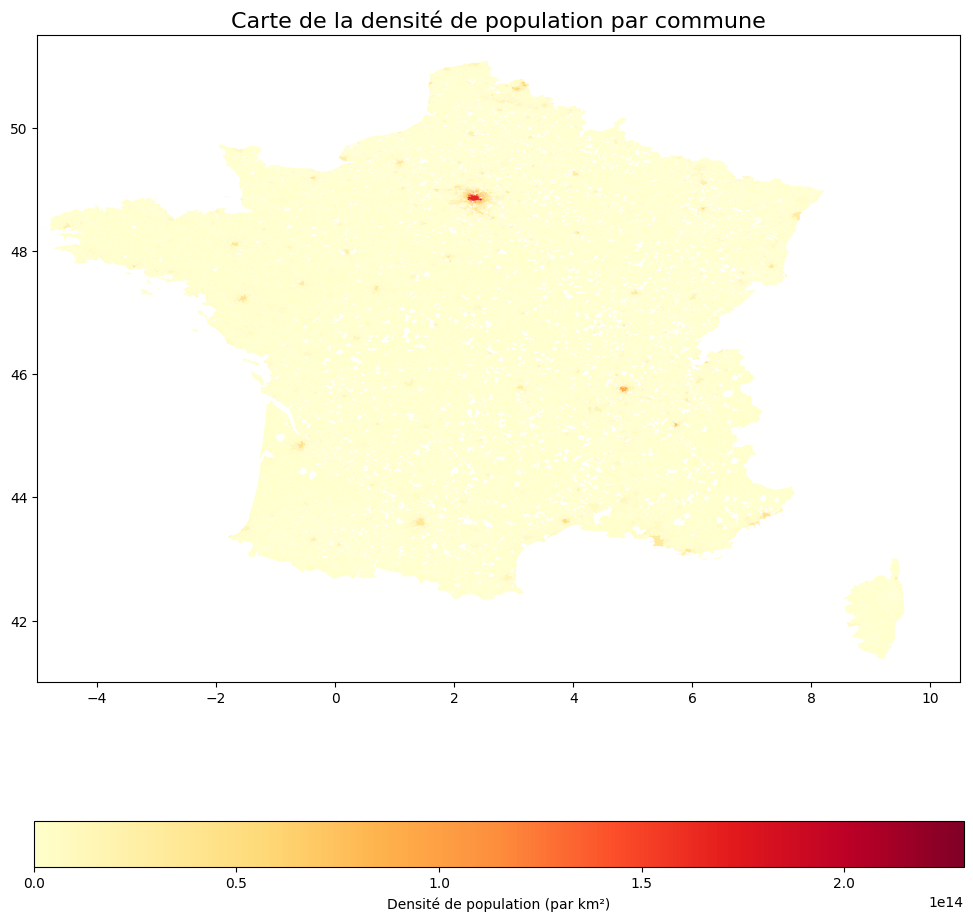

In [10]:
# Calcul de la densité de population (population / superficie en km²)
mapcom['density'] = mapcom['population'] / (mapcom.geometry.area / 1e6)  # Conversion en km²

# Créer la carte avec un gradient de couleurs pour la densité de population
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plotter la carte en utilisant la densité comme colonne pour la couleur
mapcom.plot(column='density', ax=ax, legend=True,
            legend_kwds={'label': "Densité de population (par km²)",
                         'orientation': "horizontal"},
            cmap='YlOrRd')  # Choisir la palette de couleurs

# Ajouter un titre
plt.title("Carte de la densité de population par commune", fontsize=16)

# Définir les limites pour centrer la carte sur la France métropolitaine
ax.set_xlim(-5.0, 10.5)  # Longitude minimale et maximale
ax.set_ylim(41.0, 51.5)  # Latitude minimale et maximale

# Afficher la carte
plt.show()



On remarque, en toute logique, que les communes les plus denses se trouvent au niveau des agglomérations : Paris, Lyon, Marseille... 

2.2. Données Geod'Air

In [ ]:
folder_paths = [
   r"CSV_data\GEODAIR\NO2\NO2_moy_hor_per", #Utiliser soit r"..." soit des \\ sinon les "\N" de "\NO2" posent problème
    "CSV_data\GEODAIR\O3\O3_moy_hor_per",
    "CSV_data\GEODAIR\PM2.5\PM2.5_moy_jour_per",
    "CSV_data\GEODAIR\PM10\PM10_moy_jour_per",
    "CSV_data\GEODAIR\SO2\SO2_moy_hor_per"
    ]

#Ici l'instruction "range(8,1,-1)" permet de classer les chemins du plus récent au moins récent.
all_file_paths = [[ folder + str(i) + ".csv" for i in range(8,0,-1)] for folder in folder_paths]

# On combine les 40 (5x8) jeux de données en 5 dataframes allant de janvier 2020 à décembre 2023
# Pour les polluants dans l'ordre suivant: NO2, O3, PM2.5, PM10, SO2
all_combined_df = [pd.concat([pd.read_csv(file, sep = ";") for file in all_file_paths[i]]) for i in range(5)]

# On souhaite avoir un jeu de données pour lesquels seuls les mesures ayant mesuré tous les polluants sont conservés
# On précise les colonnes sur lesquels on applique la jonction
join_columns = ["Date de début", "Date de fin", "code site"]

# On sélectionne le data frame avec le plus petit nombre de lignes
smallest_df = min(all_combined_df, key=len)

# On initialise avec les plus petit data frame
result_df = smallest_df

# On joint chaque dataframe de notre liste "all_combined_df" avec un suffixe unique
for i, df in enumerate(all_combined_df):
    if df is not smallest_df:  # pour éviter l'auto-jonction
        result_df = pd.merge(
            result_df, 
            df, 
            on=join_columns, 
            how='inner', 
            suffixes=(None, f'_df{i}')  # Un suffixe unique pour chaque data frame
        )

# result_df contient maintenant le inner join of de tous les data frames sur les colonnes spécifées
# On obtient un objet qui contient beaucoup plus de variable que ce qui nous intéresse, on vien donc procéder à un premier tri

# Soit la liste des variables les plus utiles, on peut l'utiliser pour extraire un version synthétique du de result_df
best_variables = [
    'Date de début', 'Date de fin', 'Organisme', 'code zas', 'Zas', 'code site', 'nom site', "type d'implantation", 'Latitude', 'Longitude',
    'Polluant', "type d'influence", 'type de valeur', 'valeur', 'valeur brute', 'unité de mesure','code qualité', 'validité',
    'Polluant_df0', 'type de valeur_df0', 'valeur_df0', 'valeur brute_df0', 'unité de mesure_df0','code qualité_df0', 'validité_df0',
    'Polluant_df1', 'type de valeur_df1', 'valeur_df1', 'valeur brute_df1', 'unité de mesure_df1','code qualité_df1', 'validité_df1',
    'Polluant_df2', 'type de valeur_df2', 'valeur_df2', 'valeur brute_df2', 'unité de mesure_df2','code qualité_df2', 'validité_df2',
    'Polluant_df3', 'type de valeur_df3', 'valeur_df3', 'valeur brute_df3', 'unité de mesure_df3','code qualité_df3', 'validité_df3',
]

best_df = result_df[best_variables]

# Etape cosmétique pour faciliter la lecture des données intermédiaires
# On définit une fonction pour renommer les colonnes
# Définir les colonnes qui doivent garder leur nom tel quel
columns_to_keep = [
    'Date de début', 'Date de fin', 'Organisme', 'code zas', 'Zas', 
    'code site', 'nom site', "type d'implantation", 'Latitude', 'Longitude'
]

# Définir la fonction pour renommer les colonnes
def rename_columns(column_name):
    # Vérifier si la colonne doit conserver son nom
    if column_name in columns_to_keep:
        return column_name
    # Ajouter le suffixe "_SO2" pour les colonnes sans suffixe qui ne sont pas dans columns_to_keep
    elif not any(column_name.endswith(suffixe) for suffixe in ["_df0", "_df1", "_df2", "_df3"]):
        return f"{column_name}_SO2"
    # Remplacer les suffixes spécifiques
    elif column_name.endswith("_df0"):
        return column_name.replace("_df0", "_NO2")
    elif column_name.endswith("_df1"):
        return column_name.replace("_df1", "_O3")
    elif column_name.endswith("_df2"):
        return column_name.replace("_df2", "_PM2.5")
    elif column_name.endswith("_df3"):
        return column_name.replace("_df3", "_PM10")
    else:
        return column_name

best_df = best_df.rename(columns=rename_columns)


# Pour l'instant les données ne sont pas dans un format géographique, on transforme donc le dataframe en GeoDataFrame
best_dfgeo = gpd.GeoDataFrame(
    best_df, geometry=gpd.points_from_xy(best_df.Longitude, best_df.Latitude)
)



<>:3: SyntaxWarning: invalid escape sequence '\G'
<>:4: SyntaxWarning: invalid escape sequence '\G'
<>:5: SyntaxWarning: invalid escape sequence '\G'
<>:6: SyntaxWarning: invalid escape sequence '\G'
<>:3: SyntaxWarning: invalid escape sequence '\G'
<>:4: SyntaxWarning: invalid escape sequence '\G'
<>:5: SyntaxWarning: invalid escape sequence '\G'
<>:6: SyntaxWarning: invalid escape sequence '\G'
C:\Users\axell\AppData\Local\Temp\ipykernel_12064\2199551535.py:3: SyntaxWarning: invalid escape sequence '\G'
  "CSV_data\GEODAIR\O3\O3_moy_hor_per",
C:\Users\axell\AppData\Local\Temp\ipykernel_12064\2199551535.py:4: SyntaxWarning: invalid escape sequence '\G'
  "CSV_data\GEODAIR\PM2.5\PM2.5_moy_jour_per",
C:\Users\axell\AppData\Local\Temp\ipykernel_12064\2199551535.py:5: SyntaxWarning: invalid escape sequence '\G'
  "CSV_data\GEODAIR\PM10\PM10_moy_jour_per",
C:\Users\axell\AppData\Local\Temp\ipykernel_12064\2199551535.py:6: SyntaxWarning: invalid escape sequence '\G'
  "CSV_data\GEODAIR\SO2\

,Date de début,Date de fin,Organisme,code zas,Zas,code site,nom site,type d'implantation,Latitude,Longitude,...,code qualité_PM2.5,validité_PM2.5,Polluant_PM10,type de valeur_PM10,valeur_PM10,valeur brute_PM10,unité de mesure_PM10,code qualité_PM10,validité_PM10,geometry
12251,2021/10/15 00:00:00,2021/10/15 23:59:59,ATMO NORMANDIE,FR28ZAG01,ZAG ROUEN,FR25036,Espace du Palais,Urbaine,49.442358,1.093789,...,A,1,PM10,Moy. journalière,23.0,23.495833,µg-m3,A,1,POINT (1.09379 49.44236)
20129,2020/05/25 00:00:00,2020/05/25 23:59:59,ATMO SUD,FR93ZAG01,ZAG MARSEILLE-AIX,FR03043,MARSEILLE 5 AVENUES,Urbaine,43.305287,5.394716,...,R,1,PM10,Moy. journalière,13.0,12.816667,µg-m3,R,1,POINT (5.39472 43.30529)
14609,2021/03/28 00:00:00,2021/03/28 23:59:59,ATMO SUD,FR93ZAG01,ZAG MARSEILLE-AIX,FR03043,MARSEILLE 5 AVENUES,Urbaine,43.305287,5.394716,...,A,1,PM10,Moy. journalière,10.0,10.066667,µg-m3,A,1,POINT (5.39472 43.30529)
3213,2023/02/02 00:00:00,2023/02/02 23:59:59,ATMO REUNION,FR04ZAR01,ZAR SAINT-DENIS,FR38020,Plateau Caillou,Urbaine,-21.022112,55.266773,...,A,1,PM10,Moy. journalière,13.0,13.062500,µg-m3,A,1,POINT (55.26677 -21.02211)
15594,2021/06/05 00:00:00,2021/06/05 23:59:59,ATMO REUNION,FR04ZAR02,ZAR VOLCAN,FR38011,Station Luther King,Urbaine,-21.334406,55.459060,...,A,1,PM10,Moy. journalière,8.0,7.858333,µg-m3,A,1,POINT (55.45906 -21.33441)


In [5]:
#On revient maintenant à notre liste de dataframe, afin de pouvoir identifier les communes au sein desquelles les mesures ont été faites
#Pour rappel, on a tous les df dans la liste all_combined_df
result = []
result_simple = []
result_simple_agg = []
geometries = []
variable_gdf = []

# On séléctionne les variables les plus intéréssantes pour le projet 
variable_interet = ['Date de fin',
                    "type d'implantation",
                    "type d'influence", 
                    'valeur', 
                    'geometry',
                    'index_right', 
                    'id', 
                    'nom', 
                    'nom_m', 
                    'insee_com', 
                    'statut',
                    'population', 
                    'insee_can', 
                    'insee_arr', 
                    'insee_dep', 
                    'insee_reg',
                    'siren_epci', 
                    'crsCoord'
                    ]

for indice_polluant in range(5):
    gdf = gpd.GeoDataFrame(all_combined_df[indice_polluant], geometry=gpd.points_from_xy(all_combined_df[indice_polluant].Longitude, all_combined_df[indice_polluant].Latitude)).set_crs('EPSG:4326') #EPSG:4326 est le CRS correspondant aux longitudes-latitudes
    #On projette mapcom les données dans le même CRS
    mapcom = mapcom.to_crs(gdf.crs) 
    #Jonction spatiale, l'argument within identifie les coordonnées qui sont au sein des géométries des communes
    result.append(gpd.sjoin(gdf, mapcom, how="left", predicate="within"))
    # Cette étape permet de formater les dates au format datetime
    result[indice_polluant]['Date de fin'] = result[indice_polluant]['Date de fin'].apply(format_date)

    result_simple.append(result[indice_polluant][variable_interet])

    #On va maintenant grouper les mesures par commune et par jour pour alléger le jeu de données
    result_simple_agg.append(result_simple[indice_polluant].groupby(['nom_m', 'Date de fin'], as_index=False).agg({'valeur': 'mean'}))
    
    # On ajoute ici une géométrie en reprenant la première géométrie de chaque groupe
    geometries.append(result_simple[indice_polluant].groupby(['nom_m', 'Date de fin'])['geometry'].first().reset_index())
    
    # On fusionne pour réassocier la géométrie
    variable_gdf.append(gpd.GeoDataFrame(result_simple_agg[indice_polluant].merge(geometries[indice_polluant],on=['nom_m', 'Date de fin']),geometry='geometry', crs=result_simple[indice_polluant].crs))
    
    # On renomme 'Date de fin' en un plus simple 'date'
    variable_gdf[indice_polluant].rename(columns = {'Date de fin' : 'date'}, inplace = True)

# On obtient pour chaque polluant un GéoDataFrame ayant les données suivantes: 
# nom de la commune en majuscule ('nom_m')
# date au format datetime ('date')
# La valeur moyenne des mesures de pulluants ce jour là et à cette date là ('valeur')
# Les coordonnées sous forme d'un objet POINT ('geometry')
variable_gdf[4].sample(5)

,nom_m,date,valeur,geometry
84986,SAINTE-ADRESSE,2020-03-09,1.5,POINT (0.08461 49.50386)
95194,VIEUX-THANN,2020-06-24,67.7,POINT (7.12284 47.80221)
14151,DAMPARIS,2020-08-05,5.5,POINT (5.41503 47.06564)
96488,VITROLLES,2020-01-11,2.8,POINT (5.25414 43.44603)
83858,SAINT-ROMAIN-DE-COLBOSC,2020-12-25,1.5,POINT (0.35873 49.52893)


In [6]:
# Enfin, on vient fusionner les 5 dataframe en un (outer join car on veut conserver le plus d'information possible)
all_variable_gdf1 = pd.merge(variable_gdf[0],variable_gdf[1], how='outer', on =['nom_m','date','geometry'], validate='1:1', suffixes = ('_NO2','_O3'))
all_variable_gdf2 = pd.merge(variable_gdf[2],variable_gdf[3], how='outer', on =['nom_m','date','geometry'], validate='1:1', suffixes = ('_PM2.5','_PM10'))
all_variable_gdf2 = pd.merge(all_variable_gdf2,variable_gdf[4], how='outer', on =['nom_m','date','geometry'], validate='1:1', suffixes = (False,'_SO2'))
all_variable_gdf = pd.merge(all_variable_gdf1,all_variable_gdf2, how='outer', on =['nom_m','date','geometry'], validate='1:1', suffixes = (False,False))
mapcom_simple = mapcom[['id', 'nom_m', 'insee_com', 'statut', 'population', 'insee_dep']]
all_variable_gdf = pd.merge(all_variable_gdf, mapcom_simple, how = 'left', on = 'nom_m', validate = 'm:1',suffixes = (False,False))


#Etape cosmétique pour faciliter la lisibilité (on fait apparaître le nom de chaque polluant)
all_variable_gdf.rename(columns = {
    'valeur_NO2': 'NO2',
    'valeur_O3': 'O3',
    'valeur_PM2.5': 'PM2.5',
    'valeur_PM10':'PM10',
    'valeur' : 'SO2'}, inplace = True)

# On vient éliminer certains duplicatats issus d'irrégularités au sein de la variable geometry
grouping_columns = all_variable_gdf.drop(columns=['NO2', 'O3', 'PM2.5', 'PM10', 'SO2','geometry']).columns
#On enlève la colonne geometry car celle ci comporte des doublons à un 100 000ième de coordonnée près
polluants_gdf = all_variable_gdf.groupby(list(grouping_columns), as_index=False).agg({
    'NO2': 'max',
    'O3': 'max',
    'PM2.5': 'max',
    'PM10': 'max',
    'SO2': 'max'
})

#On rajoute la colonne geometry en ne conservant qu'une seulle valeur pour chaque ville
geometries = all_variable_gdf[['nom_m','geometry']].drop_duplicates(subset='nom_m')

polluants_gdf = gpd.GeoDataFrame(pd.merge(polluants_gdf,geometries, how = 'left', on= 'nom_m'),geometry='geometry', crs='EPSG:4326')

polluants_gdf

,nom_m,date,id,insee_com,statut,population,insee_dep,NO2,O3,PM2.5,PM10,SO2,geometry
0,AGDE,2020-01-01,COMMUNE_0000000009761167,34003,Commune simple,29103,34,23.2,53.4,NaN,NaN,NaN,POINT (3.50484 43.2875)
1,AGDE,2020-01-02,COMMUNE_0000000009761167,34003,Commune simple,29103,34,32.8,33.9,NaN,NaN,NaN,POINT (3.50484 43.2875)
2,AGDE,2020-01-03,COMMUNE_0000000009761167,34003,Commune simple,29103,34,24.6,55.1,NaN,NaN,NaN,POINT (3.50484 43.2875)
3,AGDE,2020-01-04,COMMUNE_0000000009761167,34003,Commune simple,29103,34,11.4,67.2,NaN,NaN,NaN,POINT (3.50484 43.2875)
4,AGDE,2020-01-05,COMMUNE_0000000009761167,34003,Commune simple,29103,34,26.7,67.8,NaN,NaN,NaN,POINT (3.50484 43.2875)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
560652,XONRUPT-LONGEMER,2023-12-27,COMMUNE_0000000009741120,88531,Commune simple,1488,88,1.7,77.8,NaN,NaN,NaN,POINT (7.01111 48.05112)
560653,XONRUPT-LONGEMER,2023-12-28,COMMUNE_0000000009741120,88531,Commune simple,1488,88,1.7,73.2,NaN,NaN,NaN,POINT (7.01111 48.05112)
560654,XONRUPT-LONGEMER,2023-12-29,COMMUNE_0000000009741120,88531,Commune simple,1488,88,1.4,71.8,NaN,NaN,NaN,POINT (7.01111 48.05112)
560655,XONRUPT-LONGEMER,2023-12-30,COMMUNE_0000000009741120,88531,Commune simple,1488,88,0.8,74.4,NaN,NaN,NaN,POINT (7.01111 48.05112)


Pour le jeu de données Geod'Air, sur les polluants atmosphériques, il est déjà important de comprendre que la base de données est incomplète. En effet, toutes les stations ne mesurent pas les 5 polluants que l'on étudie ici.  

In [ ]:
#Pour chaque polluant, on s'intéresse au pourcentage de valeurs manquantes

columns = ['NO2', 'O3', 'PM2.5', 'PM10', 'SO2']

# Compter les valeurs manquantes pour ces colonnes
missing_counts = polluants_gdf[columns].isnull().mean() * 100

print(missing_counts)

NO2      33.495346
O3       29.817161
PM2.5    56.820659
PM10     31.053746
SO2      82.655706
dtype: float64


On remarque qu'il y a un grand nombre de valeurs manquantes pour chaque polluant. C'est notamment flagrant pour le SO2 : seules 20% des mesures le prennent en compte. 

Il n'est donc pas possible, dans ces conditions, de calculer pour chaque mesure l'indice ATMO, un indice de mesure de la qualité de l'air qui prend en input ces 5 polluants atmosphériques. L'indice ATMO classe la qualité de l'air en 6 catégories, de "Très bon" à "Très mauvais".

Afin de pouvoir appliquer cet indice, nous ne gardons ci-dessous que les lignes complètes. 

In [19]:
polluants_gdf_tronqué = polluants_gdf.dropna().copy()

In [ ]:
#On calcule les indices ATMO et IQA sur la nouvelle base de données tronquée.
#On fait appel aux fonctions iqa et atmo définies dans le notebook indice_atmo. 

from indice_atmo import *
polluants_gdf_tronqué['iqa'] = polluants_gdf_tronqué[["SO2","O3","NO2","PM2.5","PM10"]].apply(iqa, axis = 1)
polluants_gdf_tronqué['atmo'] = polluants_gdf_tronqué[["SO2","O3","NO2","PM2.5","PM10"]].apply(atmo, axis = 1)
print(polluants_gdf_tronqué[['iqa','atmo']].head())


c:\Users\axell\OneDrive\Documents\ENSAE\Projet-data-science-Mornand-Merienne\indice_atmo.py:78: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  valeurs_indice = [50*mesure_polluants_iqa[i]/valeurs_ref[i] for i in range(5)]
c:\Users\axell\OneDrive\Documents\ENSAE\Projet-data-science-Mornand-Merienne\indice_atmo.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if mesure_polluants[i] > tableau_ref[i][4] :
c:\Users\axell\OneDrive\Documents\ENSAE\Projet-data-science-Mornand-Merienne\indice_atmo.py:34: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will alway

             iqa     atmo
4375  108.357143  dégradé
4376  106.142857  dégradé
4377   95.357143  dégradé
4378   94.714286  dégradé
4379   94.357143  dégradé


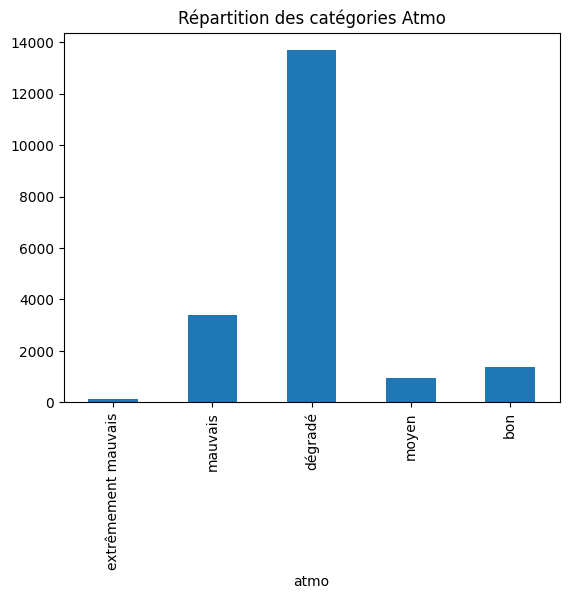

In [27]:
#On affiche un histogramme pour la distribution de la qualité de l'air selon l'indice ATMO

# Définir un ordre personnalisé des catégories
ordre = ["extrêmement mauvais", "mauvais", "dégradé", "moyen", "bon"]  # Exemple d'ordre

# Réorganiser les valeurs dans 'iqa' selon cet ordre
polluants_gdf_tronqué["atmo"] = pd.Categorical(polluants_gdf_tronqué["atmo"], categories=ordre, ordered=True)

# Afficher l'histogramme avec l'ordre personnalisé
ax = polluants_gdf_tronqué["atmo"].value_counts().reindex(ordre).plot(kind="bar")
ax.set_title("Répartition des catégories Atmo")
plt.show()


On remarque que la qualité de l'air est en moyenne dégradée, avec un écart-type faible ce qui souligne une forte concentration des données dans la catégorie "dégradé".

Toutefois, l'histogramme ci-dessus ne permet pas de rendre compte de l'aspect temporel des mesures. Pour en rendre compte, nous pouvons, pour chaque polluant, analyser l'évolution de sa concentration dans l'air au cours du temps. 

In [43]:
def graphe_evolution_polluant(colonne_polluant, station):
    """
    Trace l'évolution de la concentration d'un polluant au cours du temps pour une station donnée.
    
    Arguments :
        colonne_polluant : nom de la colonne associée au polluant.
        station : nom de la station à analyser.
    
    """
    # Filtrer les données pour la station spécifiée
    df_station = polluants_gdf[polluants_gdf['nom_m'] == station]
    
    # Vérifier que la colonne et la station existent
    if colonne_polluant not in polluants_gdf.columns:
        raise ValueError(f"La colonne '{colonne_polluant}' n'existe pas dans le DataFrame.")
    if df_station.empty:
        raise ValueError(f"Aucune donnée trouvée pour la station '{station}'.")
    
    # Mettre la colonne 'date' au format datetime
    polluants_gdf['date'] = pd.to_datetime(polluants_gdf['date'])
    
    # Trier par date
    df_station = df_station.sort_values(by='date')
    
    # Tracer le graphique avec moyenne mobile
    plt.figure(figsize=(10, 6))
    plt.plot(df_station['date'], df_station[colonne_polluant].rolling(window=7).mean(), label="Moyenne mobile (7 jours)", color='red')

    # Ajout de titre et labels
    plt.title(f"Évolution de {colonne_polluant} pour la station '{station}'", fontsize=14)
    plt.xlabel("Date")
    plt.ylabel(f"Concentration de {colonne_polluant}")
    plt.grid(alpha=0.5)
    plt.legend()
    plt.tight_layout()

    # Afficher le graphique
    plt.show()



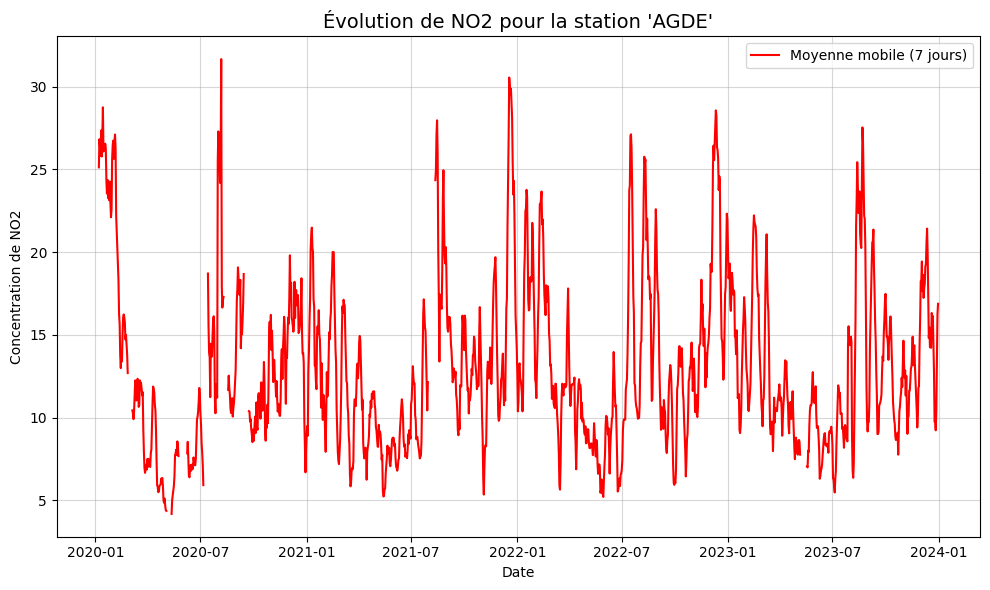

In [44]:
# On peut tester la fonction pour plusieurs polluants et stations
graphe_evolution_polluant(colonne_polluant='NO2', station='AGDE')


Ce graphique montre l'évolution de la concentration de NO2 à AGDE de début 2020 à fin 2023. On remarque déjà une grande variabilité de la concentration de NO2 sur la période, avec des fluctuations marquées et irrégulières. Les variations sont donc probablement influencées par des événements spécifiques, comme des conditions météorologiques ponctuelles ou des activités humaines irrégulières (trafic intense, émissions industrielles localisées). 

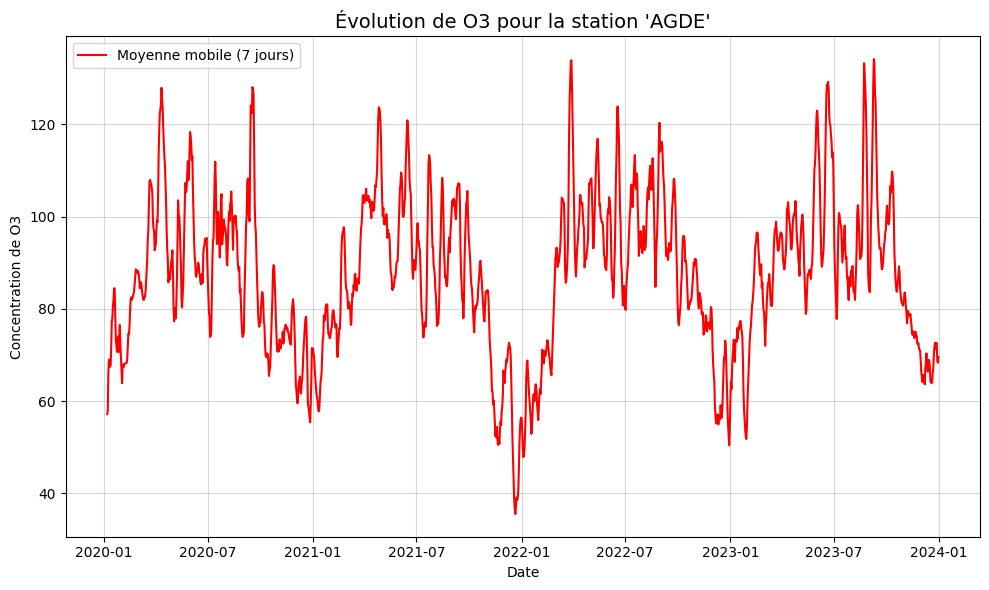

In [46]:
# On peut tester la fonction pour plusieurs polluants et stations
graphe_evolution_polluant(colonne_polluant='O3', station='AGDE')

Intéressant, on voit sur ce deuxième graphe, qui trace l'évolution de la concentration de O3 à AGDE (la même station que ci-dessus), que les variations sont bien différentes de celles du NO2. Cela semble indiquer que les évènements qui influencent la concentration de polluants dans l'atmosphère ne jouent pas forcément de la même façon sur des polluants différents. 

Dans le cas du O3, on remarque même une certaine saisonnalité : la concentration de O3 semble plus faible aux alentours de janvier, donc les basses températures jouent peut-être à la baisse sur la concentration de ce polluant dans l'atmosphère. 

On va désormais s'intéresser à la distribution géographique des stations de mesure de la qualité de l'air. Pour cela, pour chaque polluant, nous générons une carte sur laquelle se trouvent les stations qui mesurent le polluant concerné. 

In [64]:
def carte_stations(polluant = 'valeur_NO2'):

    ''' 
Argument : 
- indice polluant (par défaut égal à NO2). Permet de spécifier quel polluant sélectionner dans la base de données best_df. 

Sortie : une liste contenant 2 éléments : 
- Une carte montrant les stations qui mesurent le polluant concerné. 
- Le nombre de stations présentent pour le polluant sélectionné. 

'''

    stations = best_df[[polluant, 'Organisme','Latitude','Longitude']].drop_duplicates() #On utilise best_df car cette base de données contient directement la latitude et longitude de chaque station. 
    center = stations[["Latitude", "Longitude"]].mean().values.tolist()
    sw = stations[["Latitude", "Longitude"]].min().values.tolist()
    ne = stations[["Latitude", "Longitude"]].max().values.tolist()

    m = folium.Map(location=center, tiles="OpenStreetMap")

    for i in range(0, len(stations)):
        folium.Marker(
            [stations.iloc[i]["Latitude"], stations.iloc[i]["Longitude"]],
            popup=stations.iloc[i]["Organisme"],
            icon=folium.Icon(icon="cloud-sun-rain", prefix="fa"),
        ).add_to(m)

    m.fit_bounds([sw, ne])
    return [m, len(stations)]

In [66]:
polluants=['valeur_NO2','valeur_SO2','valeur_O3','valeur_PM2.5','valeur_PM10']
print("Nombre de stations par polluants: ",[carte_stations(polluant)[1] for polluant in polluants])

Nombre de stations par polluants:  [7398, 2004, 10130, 1967, 862]


Ceci confirme ce que nous disions plus haut : toutes les stations ne mesurent pas chaque polluant. Le polluant le plus mesuré l'est par 7398 stations différentes, et c'est le NO2. 

On génère ci-dessous la carte qui montre la localisation des stations de notre base qui mesurent le NO2. 

In [67]:
carte_stations('valeur_NO2')[0]

2.3. Données ADEME

In [3]:
#La première étape est une importation classique avec pandas
inventaire_ges = pd.read_csv("https://data.ademe.fr/data-fair/api/v1/datasets/igt-pouvoir-de-rechauffement-global/full")

#On fait apparaître la collonne des totaux et log-totaux (La distribution des totaux suit une loi log-normale)
inventaire_ges['total'] = inventaire_ges.drop(['INSEE commune', 'Commune','lat','lon'], axis = 1).sum(numeric_only=True, axis = 1)
inventaire_ges['total'] = inventaire_ges['total'].fillna(inventaire_ges['total'].mean(numeric_only=True, axis = 0))
inventaire_ges['log_total'] = np.log(inventaire_ges['total'])

#On spatialise le DataFrame à l'aide du jeu de donnée de l'INSEE
#Pour la compatibilité avec l'INSEE
inventaire_ges = inventaire_ges.rename(columns={'Commune':'nom_m'})
ademe_gdf = gpd.GeoDataFrame(
    pd.merge(inventaire_ges,mapcom, how = 'left', on = 'nom_m', validate='m:m', suffixes=(False,False)),
    geometry='geometry'
)

ademe_gdf.sample(5)

,INSEE commune,nom_m,Agriculture,Autres transports,Autres transports international,CO2 biomasse hors-total,Déchets,Energie,Industrie hors-énergie,Résidentiel,...,insee_com,statut,population,insee_can,insee_arr,insee_dep,insee_reg,siren_epci,geometry,crsCoord
26711,66090,JUJOLS,825.757894,NaN,NaN,81.855967,6.083184,2.354558,6.911213,14.364971,...,66090,Commune simple,43.0,13,3,66,76,200049211,"MULTIPOLYGON (((251414.214 5252691.647, 251544...",EPSG:3857
2856,08501,WILLIERS,1095.080813,NaN,NaN,71.814845,6.744399,2.354558,6.911213,29.708441,...,08501,Commune simple,40.0,03,3,08,44,240800847,"MULTIPOLYGON (((591089.884 6387775.973, 590826...",EPSG:3857
13125,33471,SAINT-SAUVEUR,963.787027,NaN,NaN,896.243216,171.519332,2.354558,6.911213,431.242741,...,29262,Commune simple,804.0,14,3,29,53,242900751,"MULTIPOLYGON (((-448424.325 6182887.144, -4483...",EPSG:3857
16838,44175,SAINT-LYPHARD,3188.372078,NaN,NaN,2177.262423,182.032542,32.963808,96.756987,2025.314768,...,44175,Commune simple,5104.0,09,3,44,52,244400610,"MULTIPOLYGON (((-257738.775 6000046.698, -2577...",EPSG:3857
5561,16220,LES METAIRIES,347.313011,NaN,NaN,618.716665,88.470650,16.481904,48.378493,309.399105,...,16220,Commune simple,719.0,15,2,16,75,200070514,"MULTIPOLYGON (((-17303.808 5732845.236, -17555...",EPSG:3857


Commençons par une analyse simple de la base de données ADEME (données sur les émissions de GES par commune, en tonnes équivalent CO2 par an). 

In [ ]:
colonnes=['Agriculture', 'Autres transports',
       'Autres transports international', 'CO2 biomasse hors-total', 'Déchets',
       'Energie', 'Industrie hors-énergie', 'Résidentiel', 'Routier',
       'Tertiaire']
print(ademe_gdf[colonnes].describe())

        Agriculture  Autres transports  Autres transports international  \
count  35736.000000        9979.000000                     2.891000e+03   
mean    2459.975760         654.919940                     7.692345e+03   
std     2926.957701        9232.816833                     1.137643e+05   
min        0.003432           0.000204                     3.972950e-04   
25%      797.682631          52.560412                     1.005097e+01   
50%     1559.381285         106.795928                     1.992434e+01   
75%     3007.883903         237.341501                     3.298311e+01   
max    98949.317760      513140.971691                     3.303394e+06   

       CO2 biomasse hors-total        Déchets       Energie  \
count             35798.000000   35792.000000  3.449000e+04   
mean               1774.381550     410.806329  6.625698e+02   
std                7871.341922    4122.472608  2.645571e+04   
min                   3.758088       0.132243  2.354558e+00   
25%      

Les données montrent une grande variabilité des émissions de GES entre les communes françaises. Les secteurs clés comme l’agriculture (moyenne de 2459 tCO2e/an) et le transport routier (3535 tCO2e/an) génèrent des émissions diffuses et plutôt modérées à l'échelle communale tandis que l’industrie hors-énergie et les transports internationaux atteingent des maxima très élevés (plusieurs millions de tCO2e/an), indiquant une forte concentration des émissions dans quelques zones spécifiques. La distribution asymétrique des données, avec des moyennes souvent supérieures aux médianes, souligne l'impact disproportionné de certaines communes ou activités. 

Il faut également souligner que les différentes colonnes n'ont pas le même nombre de données. Ces données manquantes peuvent biaiser l'analyse et réduisent la comparabilité entre secteurs. 